In [10]:
import os
import cv2
import time
import nibabel as nib
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from tqdm.notebook import tqdm

In [23]:
basedir = '/data2/share/hubmap_organ_segmentation/'
imagedir = os.path.join(basedir, 'train_images')
fname_train = os.path.join(basedir, 'train.csv')

In [118]:
df_train = pd.read_csv(fname_train)
df_train['path'] = df_train['id'].apply(lambda x: os.path.join(imagedir, f'{x}.tiff'))
df_train = df_train.set_index(['organ', 'id'])#.sort_index()
df_train

data_source  img_height  img_width  pixel_size  \
organ          id                                                     
prostate       10044         HPA        3000       3000         0.4   
               10274         HPA        3000       3000         0.4   
spleen         10392         HPA        3000       3000         0.4   
lung           10488         HPA        3000       3000         0.4   
spleen         10610         HPA        3000       3000         0.4   
...                          ...         ...        ...         ...   
kidney         9517          HPA        3000       3000         0.4   
               9769          HPA        3070       3070         0.4   
largeintestine 9777          HPA        3000       3000         0.4   
kidney         9791          HPA        3000       3000         0.4   
largeintestine 9904          HPA        3000       3000         0.4   

                      tissue_thickness  \
organ          id                        
prostate       10044                 4   
               10274                 4   
spleen         10392                 4   
lung           10488                 4   
spleen         10610                 4   
...                                ...   
kidney         9517                  4   
               9769                  4   
largeintestine 9777                  4   
kidney         9791                  4   
largeintestine 9904                  4   

                                                                    rle   age  \
organ          id                                                               
prostate       10044  1459676 77 1462675 82 1465674 87 1468673 92 14...  37.0   
               10274  715707 2 718705 8 721703 11 724701 18 727692 3...  76.0   
spleen         10392  1228631 20 1231629 24 1234624 40 1237623 47 12...  82.0   
lung           10488  3446519 15 3449517 17 3452514 20 3455510 24 34...  78.0   
spleen         10610  478925 68 481909 87 484893 105 487863 154 4908...  21.0   
...                                                                 ...   ...   
kidney         9517   1611763 11 1614753 29 1617750 35 1620746 43 16...  61.0   
               9769   4030400 28 4033466 34 4036526 48 4039594 54 40...  28.0   
largeintestine 9777   538473 13 541468 22 544463 30 547461 35 550459...  84.0   
kidney         9791   334733 33 337729 43 340729 43 343725 51 346723...  28.0   
largeintestine 9904   1009165 7 1012149 28 1015140 38 1018127 51 102...  84.0   

                         sex  \
organ          id              
prostate       10044    Male   
               10274    Male   
spleen         10392    Male   
lung           10488    Male   
spleen         10610  Female   
...                      ...   
kidney         9517     Male   
               9769     Male   
largeintestine 9777     Male   
kidney         9791     Male   
largeintestine 9904     Male   

                                                                   path  
organ          id                                                        
prostate       10044  /data2/share/hubmap_organ_segmentation/train_i...  
               10274  /data2/share/hubmap_organ_segmentation/train_i...  
spleen         10392  /data2/share/hubmap_organ_segmentation/train_i...  
lung           10488  /data2/share/hubmap_organ_segmentation/train_i...  
spleen         10610  /data2/share/hubmap_organ_segmentation/train_i...  
...                                                                 ...  
kidney         9517   /data2/share/hubmap_organ_segmentation/train_i...  
               9769   /data2/share/hubmap_organ_segmentation/train_i...  
largeintestine 9777   /data2/share/hubmap_organ_segmentation/train_i...  
kidney         9791   /data2/share/hubmap_organ_segmentation/train_i...  
largeintestine 9904   /data2/share/hubmap_organ_segmentation/train_i...  

[351 rows x 9 columns]

In [14]:
def read_image(fname):
    img = cv2.imread(fname)
    return img

10651
(3000, 3000, 3)


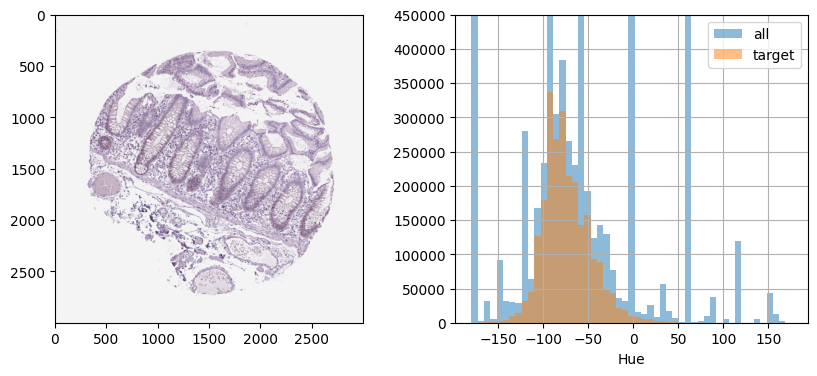

10892
(3000, 3000, 3)


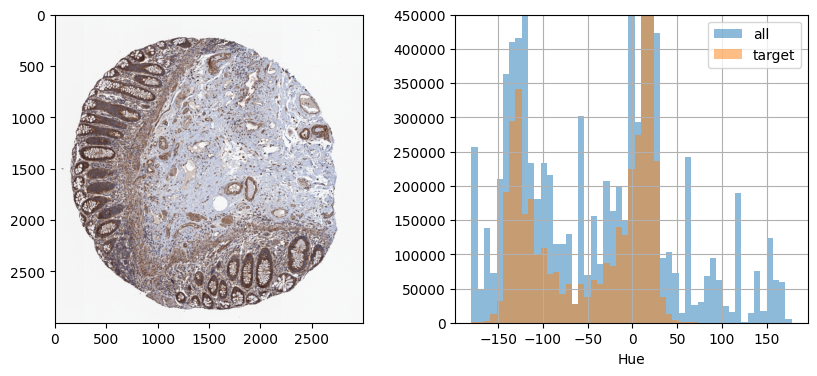

11662
(3000, 3000, 3)


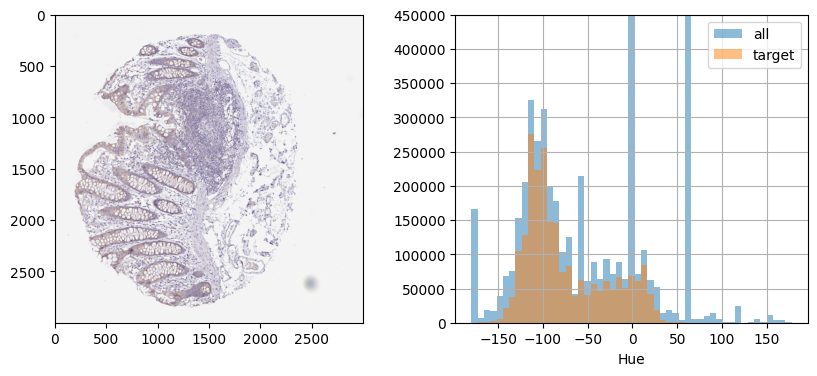

1168
(3000, 3000, 3)


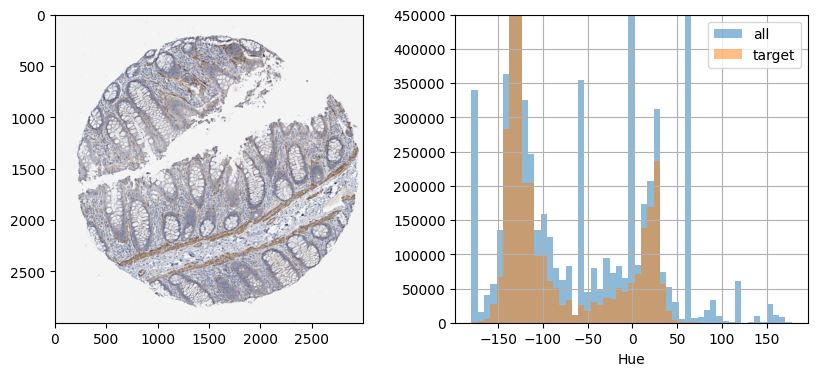

11890
(3000, 3000, 3)


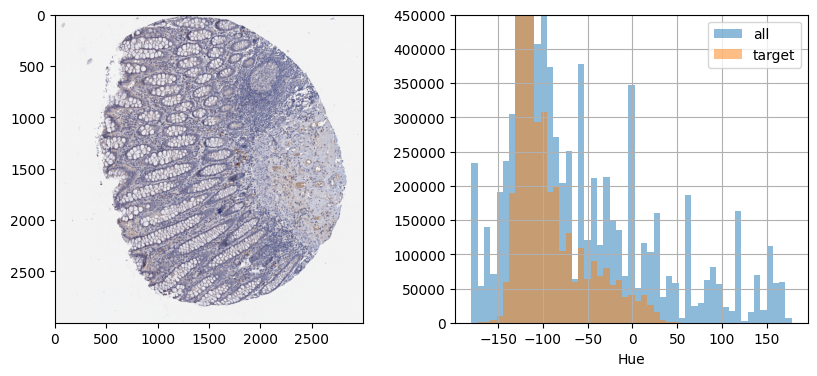

12174
(3000, 3000, 3)


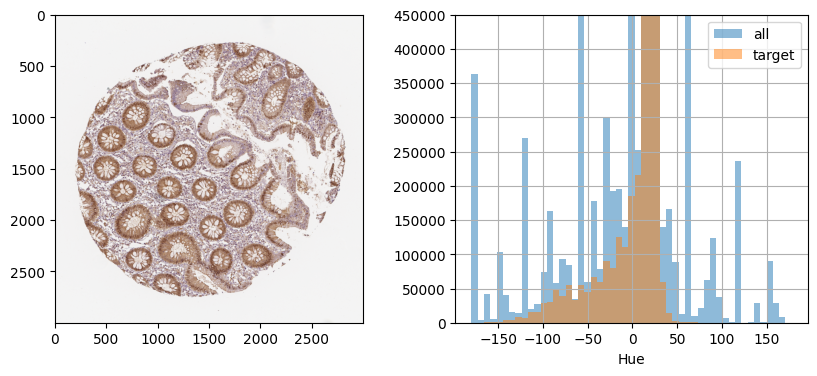

12471
(3000, 3000, 3)


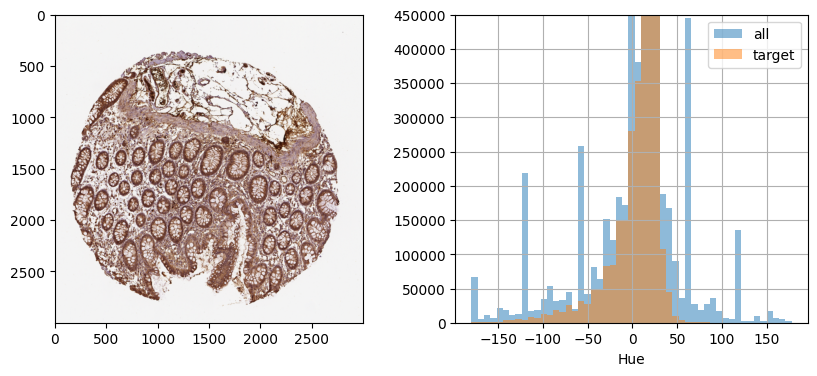

13396
(3000, 3000, 3)


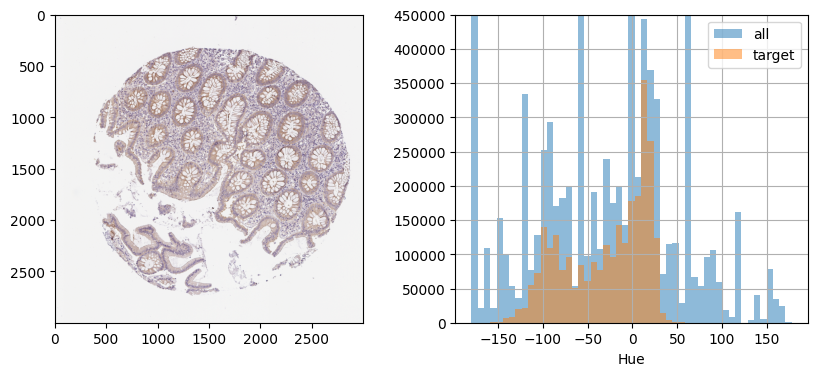

13507
(3000, 3000, 3)


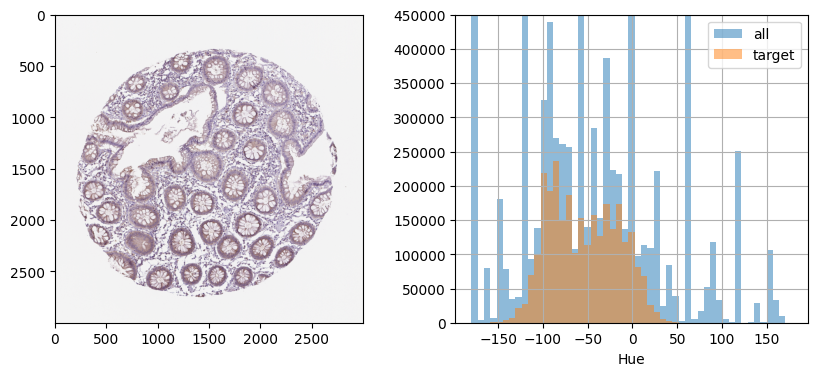

14183
(3000, 3000, 3)


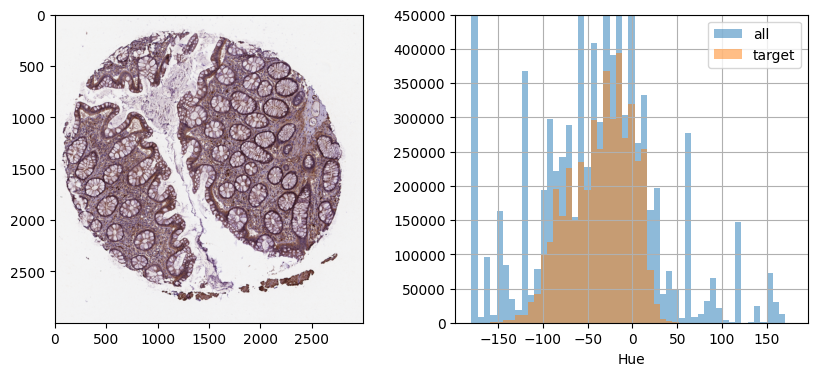

14674
(3000, 3000, 3)


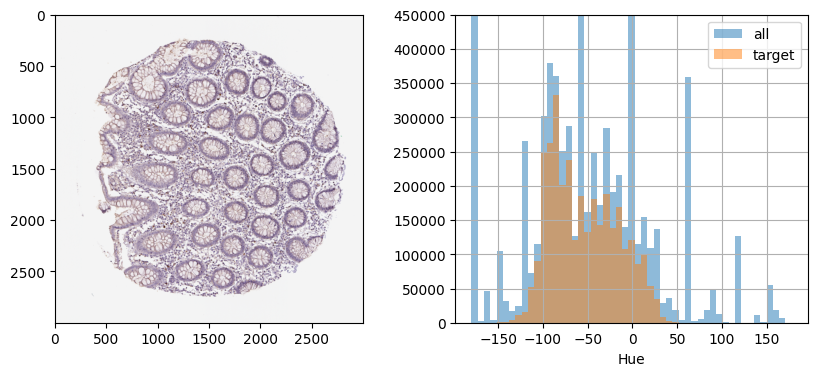

In [154]:
for i, (_id, row) in enumerate(df_train.loc['largeintestine'].iterrows()):
#     if i != 2:
#         continue
#     if _id != 12471:
#         continue
    if i > 10:
        break
    print(_id)
    img = read_image(os.path.join(row['path']))
    print(img.shape)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float64)
    N = img_hsv.shape[0]*img_hsv.shape[1]
    Nbins = 51
    thres_v = 230
    thres_s = 10
    img_hsv_filtered = img_hsv.reshape([-1, img_hsv.shape[-1]])
    img_hsv_filtered = img_hsv_filtered[(img_hsv_filtered[:,1]>thres_s) & (img_hsv_filtered[:,2]<thres_v)]
    
#     fig, ax = plt.subplots(2, 2, figsize=(10,10))
#     ax = [ax[0,0], ax[0,1], ax[1,0], ax[1,1]]
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    ax[0].imshow(img_rgb)
    
    img_hsv_shift = (img_hsv*2+180)%360-180
    img_hsv_filtered_shift = (img_hsv_filtered*2+180)%360-180
    
    ax[1].hist(img_hsv_shift[:,:,0].reshape(-1), bins=Nbins, alpha=0.5, label='all')
    ax[1].hist(img_hsv_filtered_shift[:,0], bins=Nbins, alpha=0.5, label='target')
#     ax[1].set_yscale('log')
    ax[1].set_ylim(0, N/20)
#     ax[1].set_xlim(0, 360)
    ax[1].set_xlabel('Hue')
    ax[1].grid()
    ax[1].legend()
    
#     ax[2].hist(img_hsv[:,:,1].reshape(-1), bins=Nbins, alpha=0.5, label='all')
#     ax[2].hist(img_hsv[:200,:,1].reshape(-1), bins=Nbins, alpha=0.5, label='background')
#     ax[2].set_yscale('log')
#     ax[2].set_xlabel('Saturation')
#     ax[2].vlines([thres_s], 0.1, int(N/Nbins)*100, color='r')
#     ax[2].set_xlim(0, 255)
#     ax[2].set_ylim(0.1, int(N/Nbins)*100)
#     ax[2].grid()
#     ax[2].legend()
    
#     ax[3].hist(img_hsv[:,:,2].reshape(-1), bins=Nbins, alpha=0.5, label='all')
#     ax[3].hist(img_hsv[:200,:,2].reshape(-1), bins=Nbins, alpha=0.5, label='background')
#     ax[3].set_yscale('log')
#     ax[3].set_xlabel('Value')
#     ax[3].vlines([thres_v], 0.1, int(N/Nbins)*100, color='r')
#     ax[3].set_xlim(0, 255)
#     ax[3].set_ylim(0.1, int(N/Nbins)*100)
#     ax[3].grid()
#     ax[3].legend()
    
    plt.show()
#     break

10651
(3000, 3000, 3)


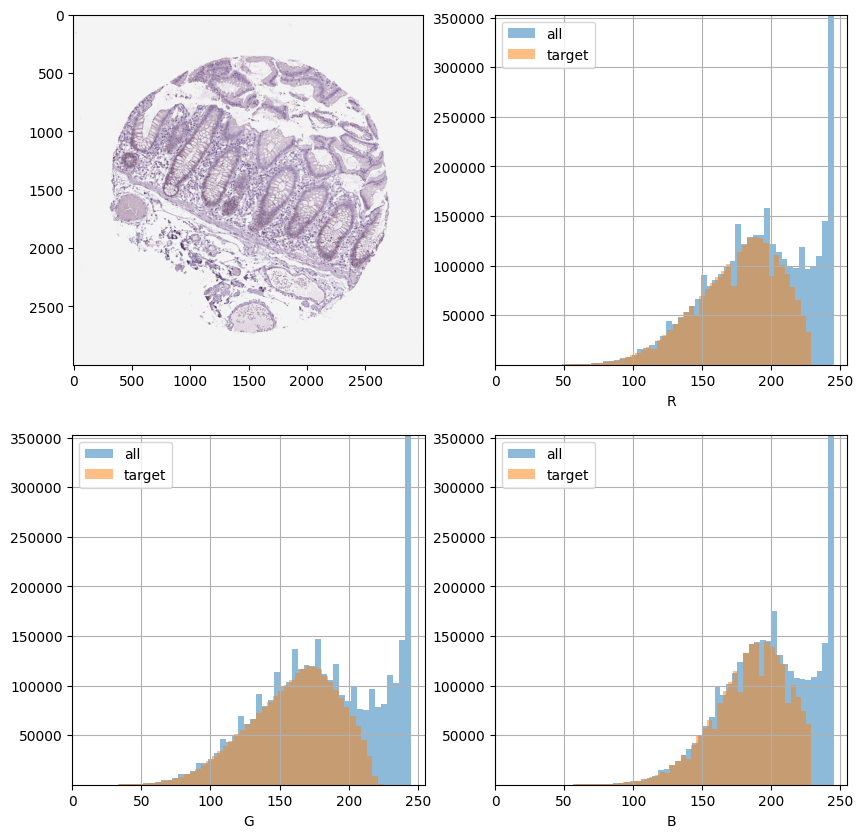

10892
(3000, 3000, 3)


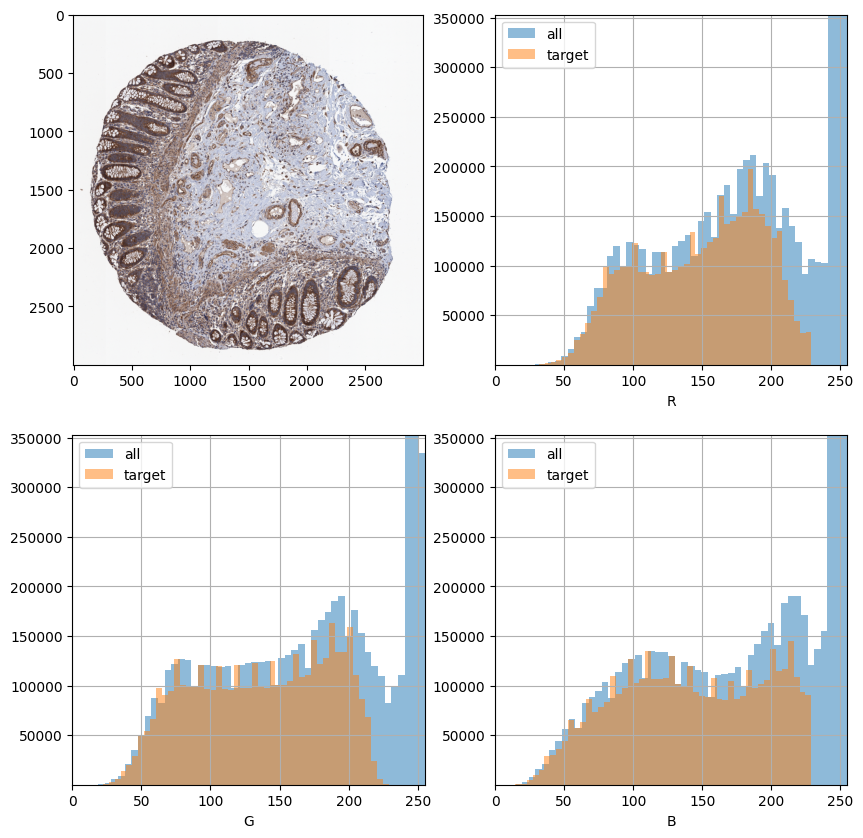

11662
(3000, 3000, 3)


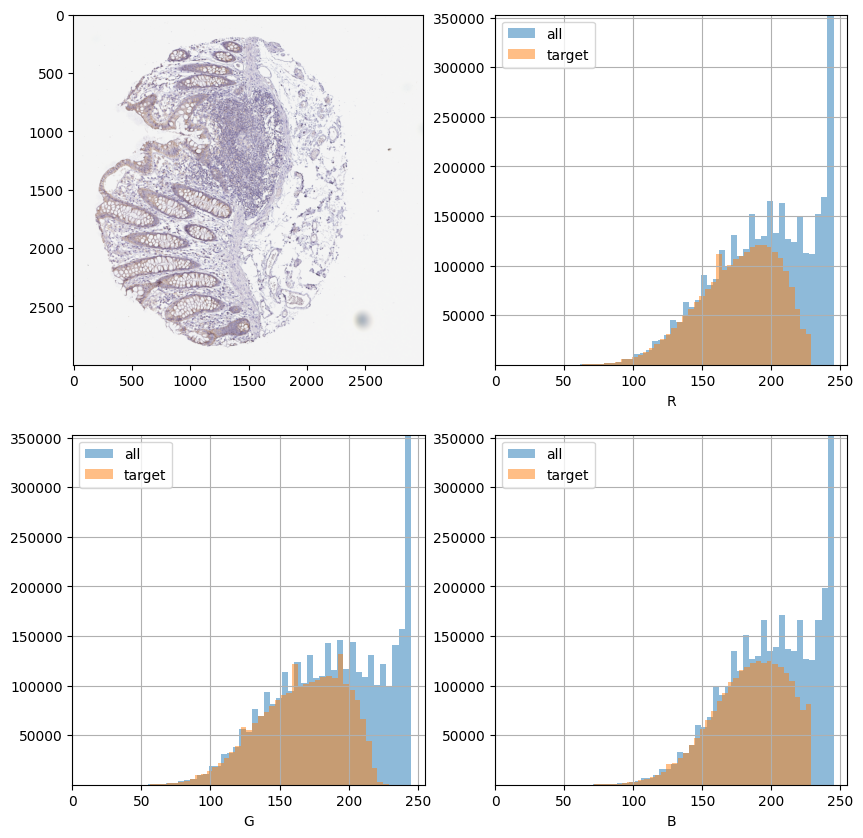

1168
(3000, 3000, 3)


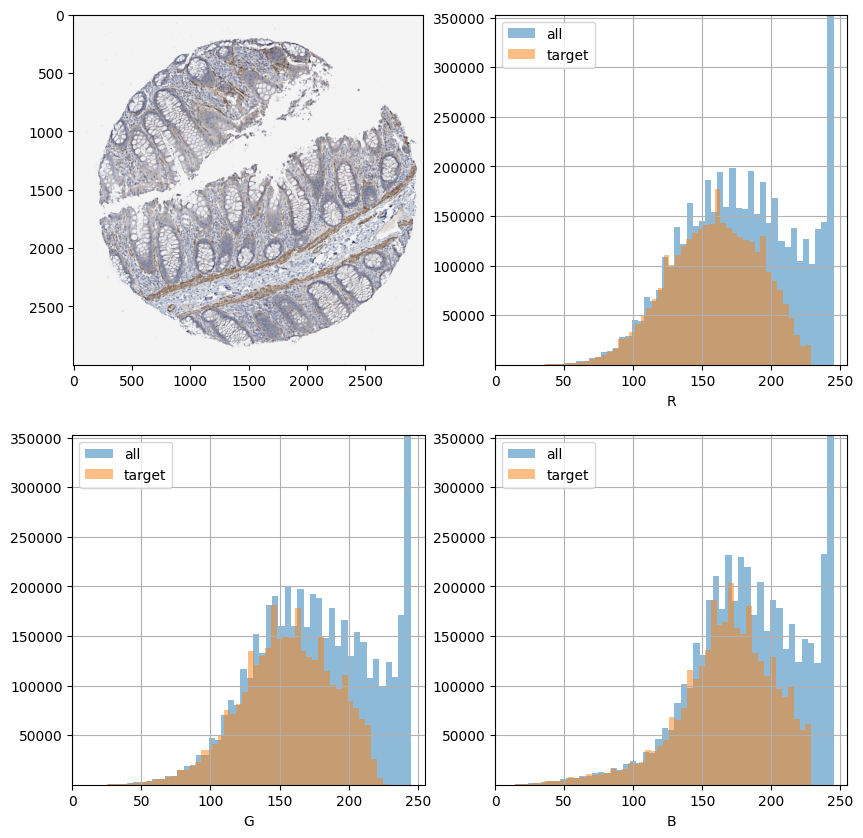

11890
(3000, 3000, 3)


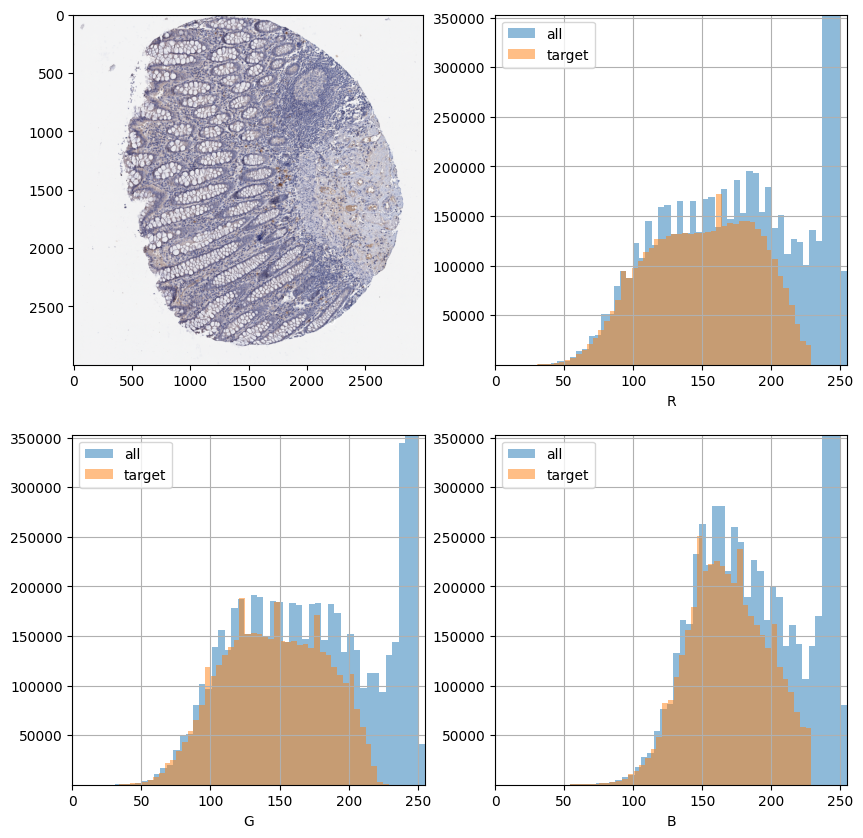

12174
(3000, 3000, 3)


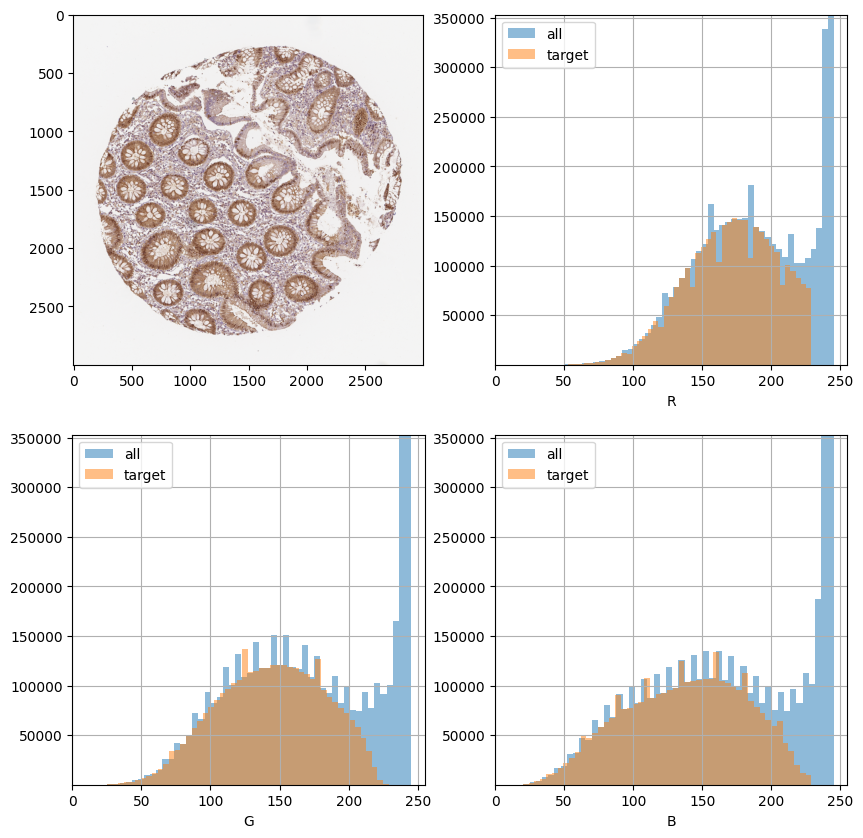

12471
(3000, 3000, 3)


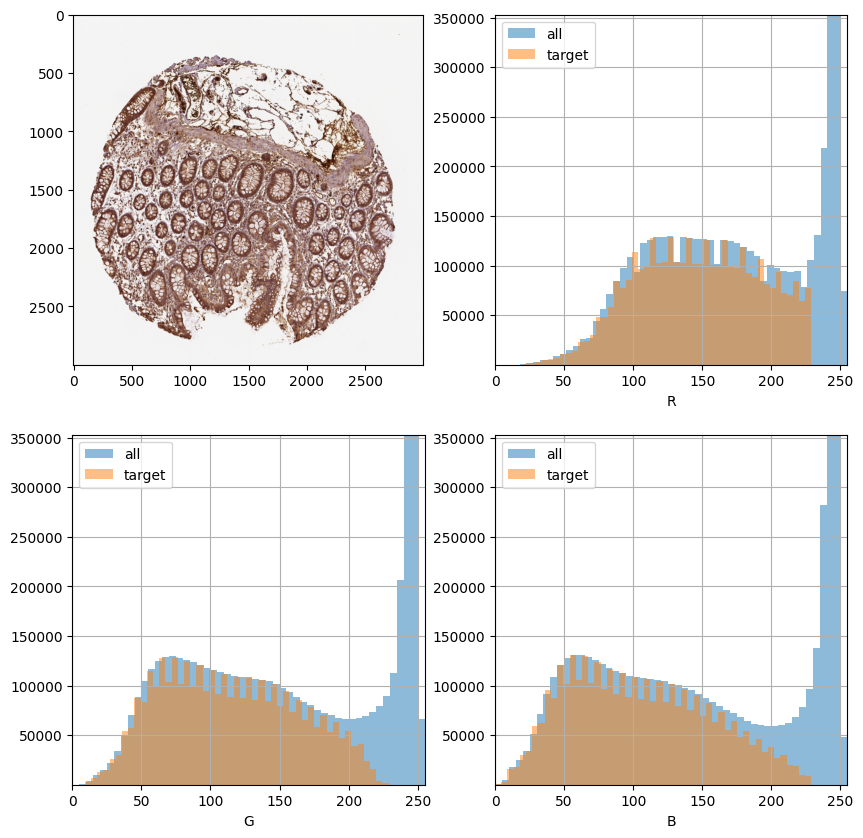

13396
(3000, 3000, 3)


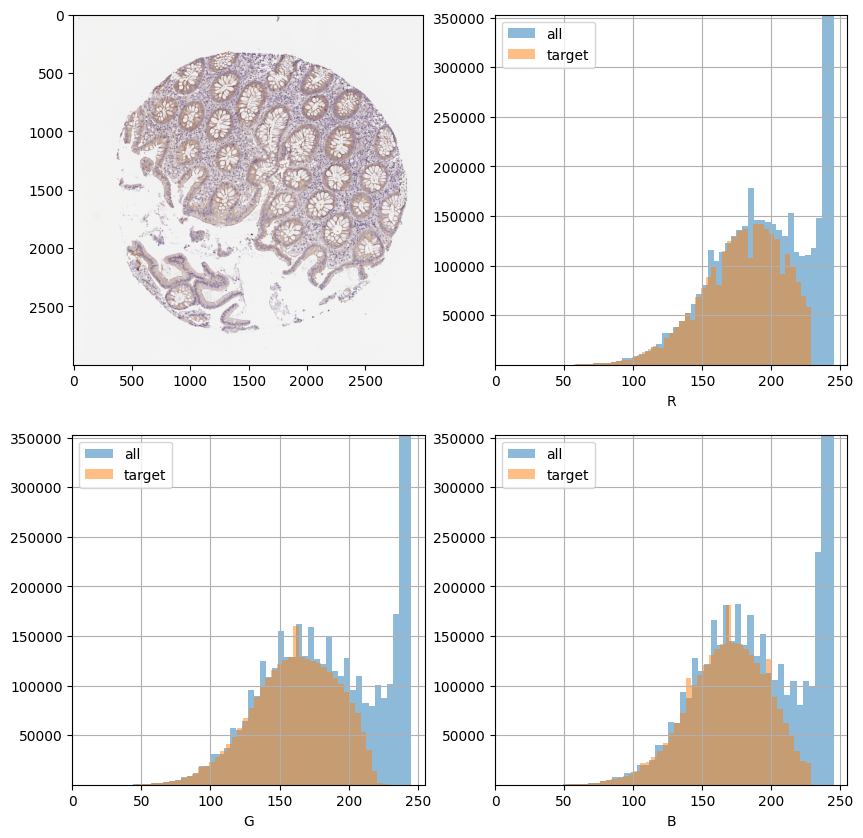

13507
(3000, 3000, 3)


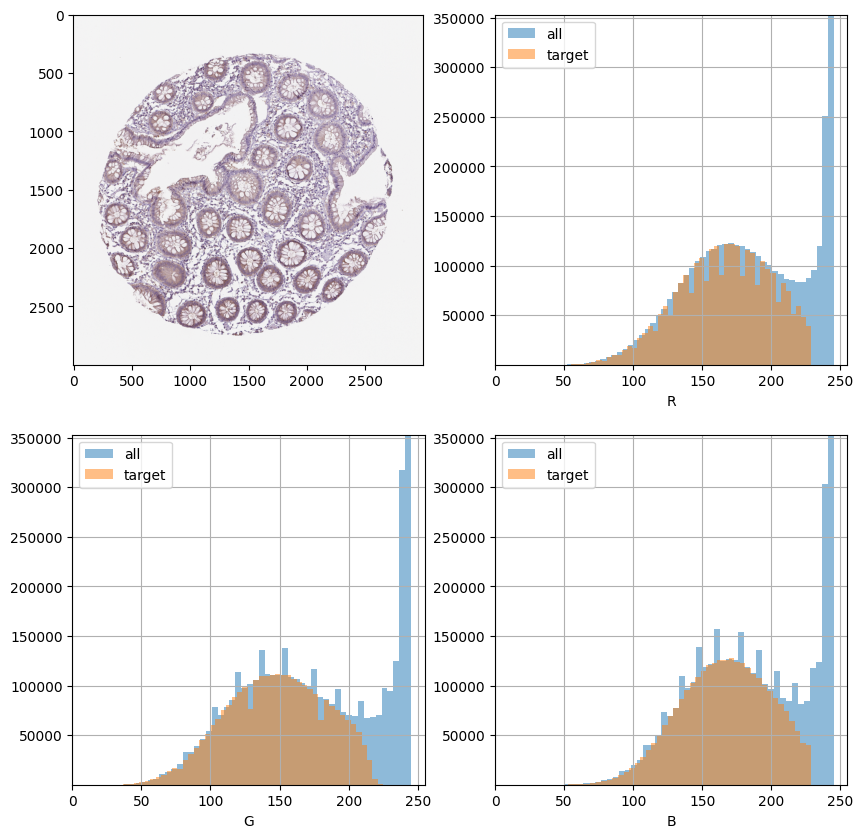

14183
(3000, 3000, 3)


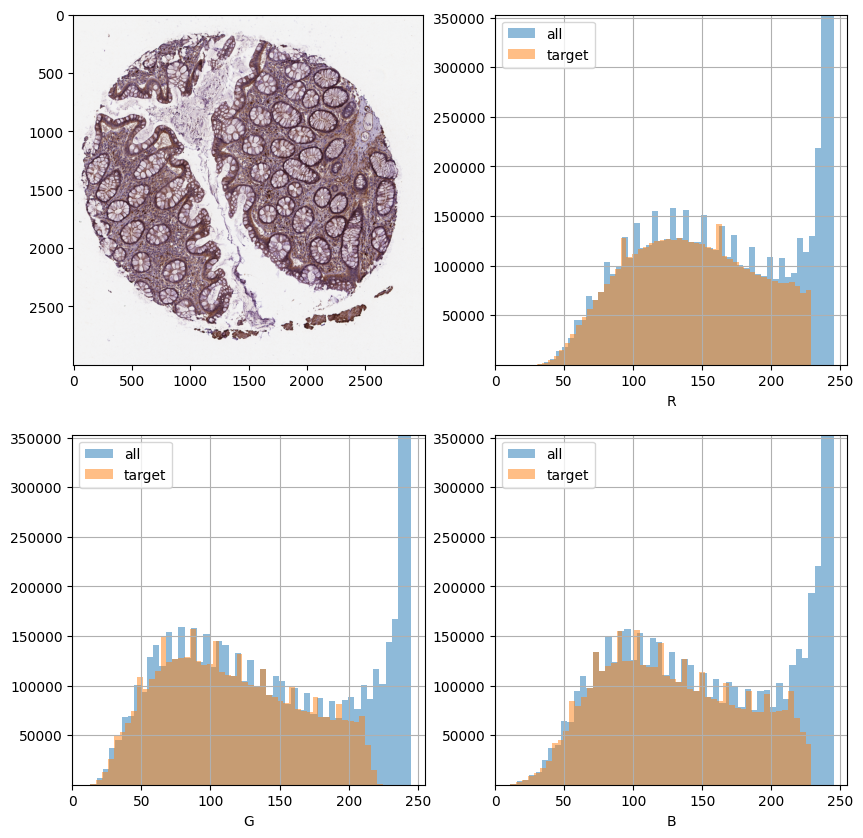

14674
(3000, 3000, 3)


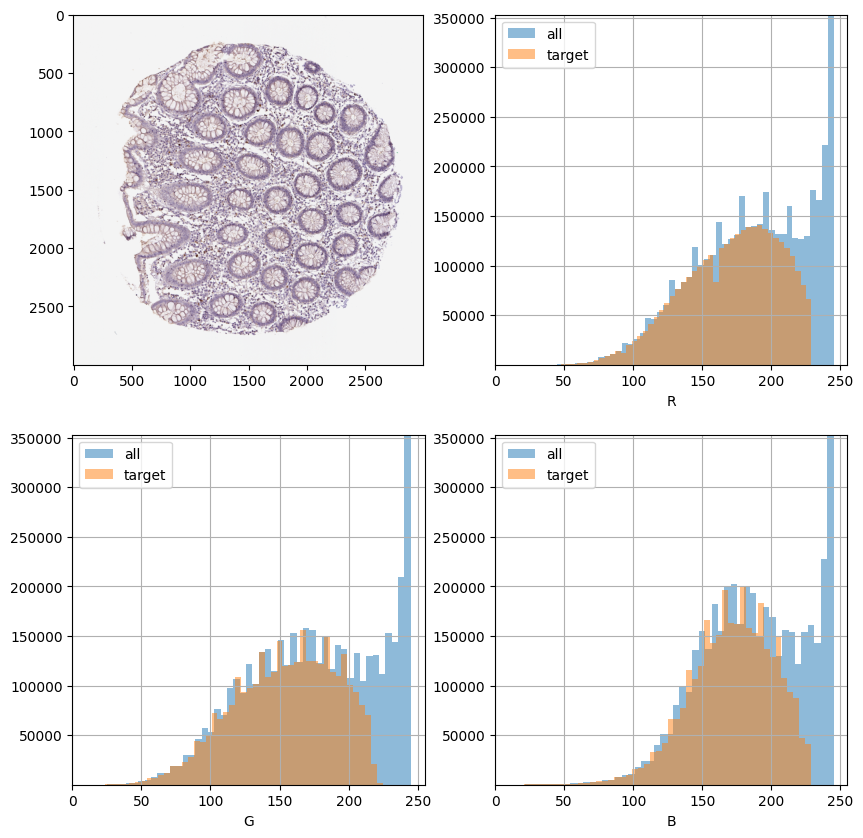

In [170]:
for i, (_id, row) in enumerate(df_train.loc['largeintestine'].iterrows()):
#     if i != 2:
#         continue
#     if _id != 12471:
#         continue
    if i > 10:
        break
    print(_id)
    img = read_image(os.path.join(row['path']))
    print(img.shape)
    img_rgb_show = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb = img_rgb_show.astype(np.float64)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float64)
    N = img.shape[0]*img.shape[1]
    Nbins = 51
    thres_v = 230
    thres_s = 10
    img_hsv_rs = img_hsv.reshape([-1, img_hsv.shape[-1]])
    img_rgb_filtered = img_rgb.reshape([-1, img_rgb.shape[-1]])
    img_rgb_filtered = img_rgb_filtered[(img_hsv_rs[:,1]>thres_s) & (img_hsv_rs[:,2]<thres_v)]
    
    fig, ax = plt.subplots(2, 2, figsize=(10,10))
    ax = [ax[0,0], ax[0,1], ax[1,0], ax[1,1]]
#     fig, ax = plt.subplots(1, 2, figsize=(10,4))
    ax[0].imshow(img_rgb_show)
    
    ax[1].hist(img_rgb[:,:,0].reshape(-1), bins=Nbins, alpha=0.5, label='all')
    ax[1].hist(img_rgb_filtered[:,0].reshape(-1), bins=Nbins, alpha=0.5, label='target')
#     ax[1].set_yscale('log')
    ax[1].set_xlabel('R')
    ax[1].set_xlim(0, 255)
    ax[1].set_ylim(0.1, int(N/Nbins)*2)
    ax[1].grid()
    ax[1].legend()
    
    ax[2].hist(img_rgb[:,:,1].reshape(-1), bins=Nbins, alpha=0.5, label='all')
    ax[2].hist(img_rgb_filtered[:,1].reshape(-1), bins=Nbins, alpha=0.5, label='target')
#     ax[2].set_yscale('log')
    ax[2].set_xlabel('G')
    ax[2].set_xlim(0, 255)
    ax[2].set_ylim(0.1, int(N/Nbins)*2)
    ax[2].grid()
    ax[2].legend()
    
    ax[3].hist(img_rgb[:,:,2].reshape(-1), bins=Nbins, alpha=0.5, label='all')
    ax[3].hist(img_rgb_filtered[:,2].reshape(-1), bins=Nbins, alpha=0.5, label='target')
#     ax[3].set_yscale('log')
    ax[3].set_xlabel('B')
    ax[3].set_xlim(0, 255)
    ax[3].set_ylim(0.1, int(N/Nbins)*2)
    ax[3].grid()
    ax[3].legend()
    
    plt.show()
#     break

10611
(3000, 3000, 3)


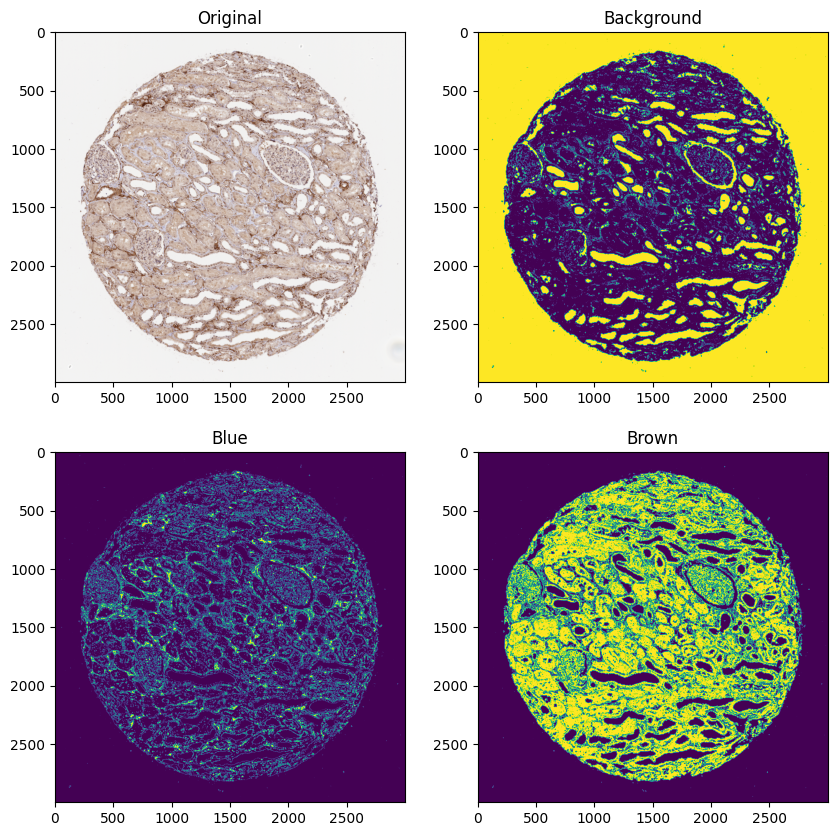

11497
(3000, 3000, 3)


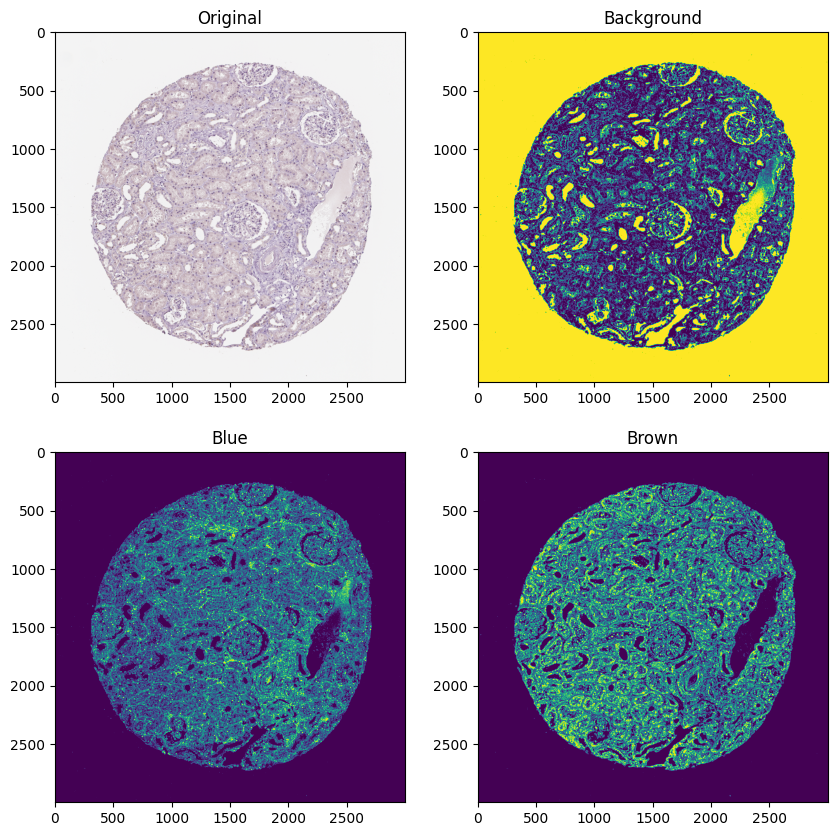

1157
(3000, 3000, 3)


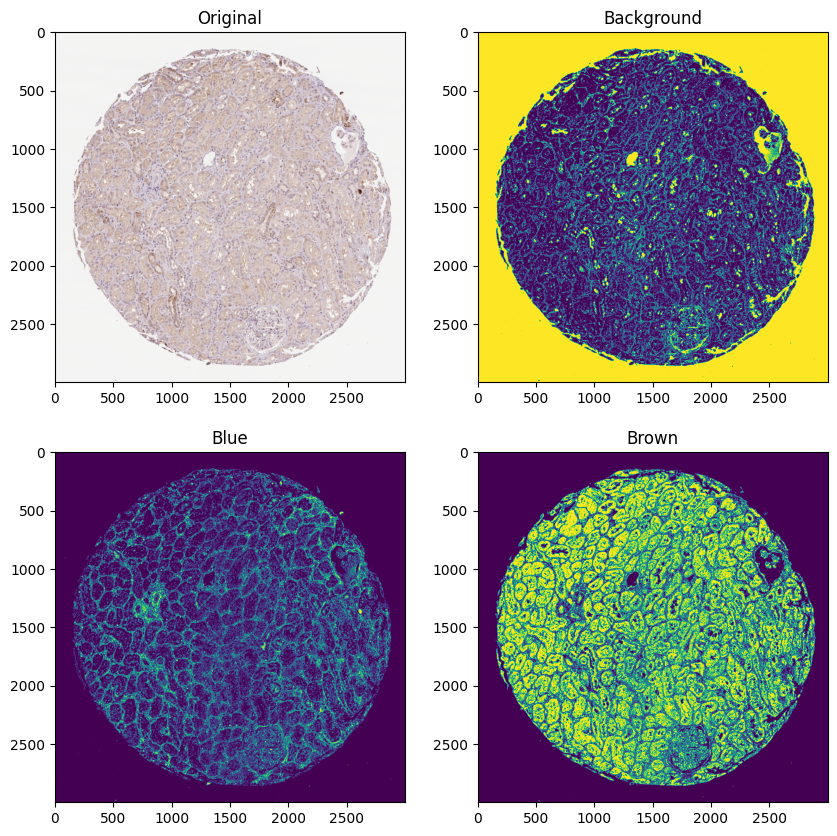

12784
(2727, 2727, 3)


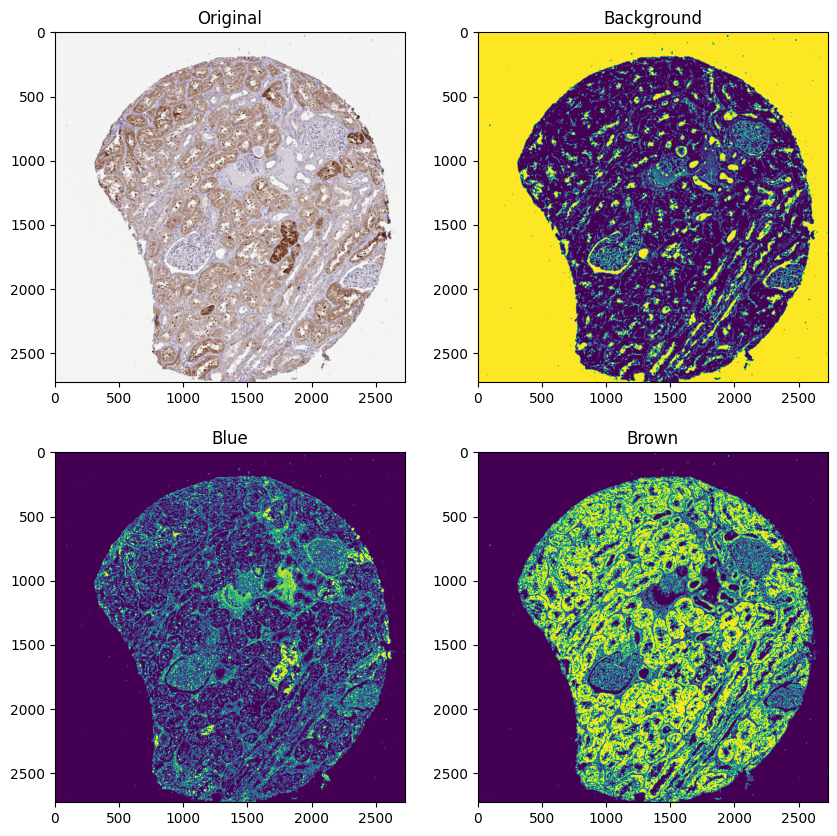

13034
(3000, 3000, 3)


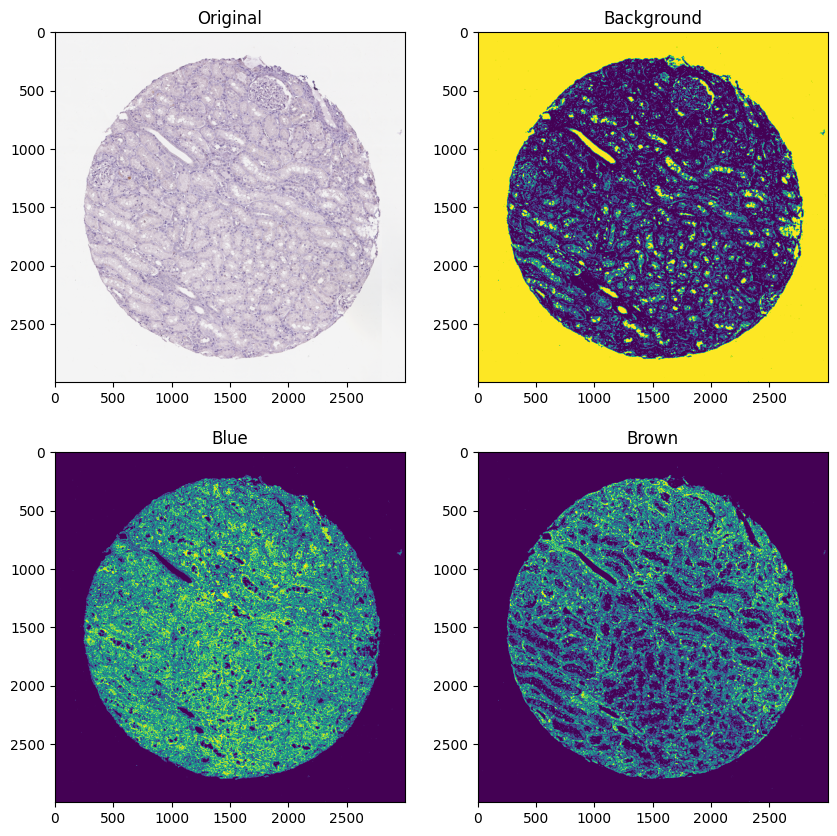

13260
(3000, 3000, 3)


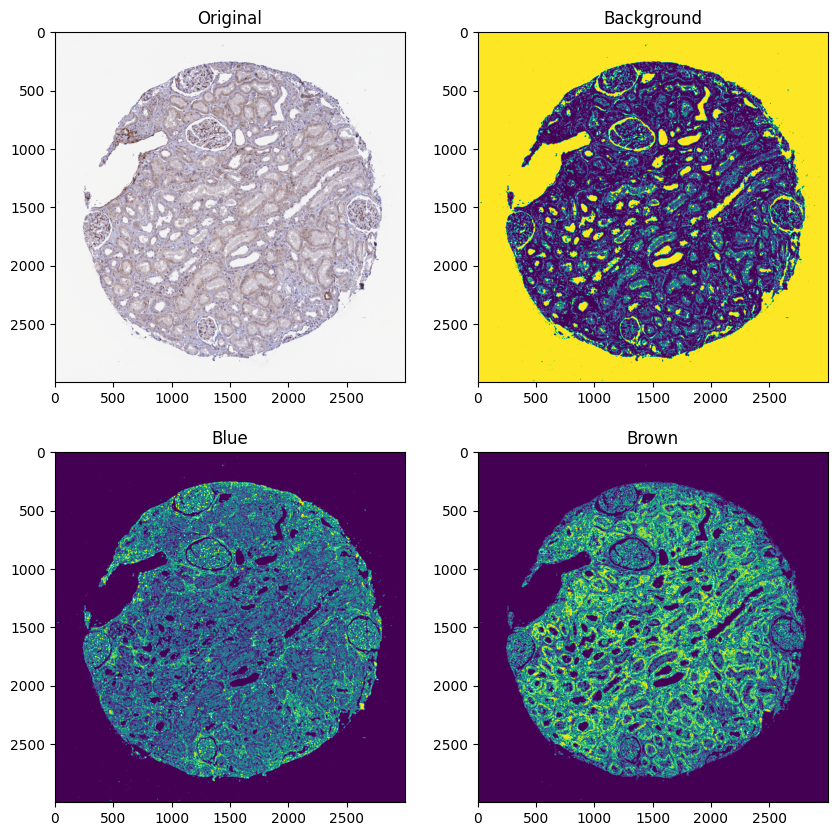

In [202]:
for i, (_id, row) in enumerate(df_train.loc['kidney'].iterrows()):
#     if i != 2:
#         continue
#     if _id != 12471:
#         continue
    if i > 5:
        break
    print(_id)
    img = read_image(os.path.join(row['path']))
    print(img.shape)
    img_rgb_show = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb = img_rgb_show.astype(np.float64)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float64)
    N = img.shape[0]*img.shape[1]
    Nbins = 51
    thres_v = 230
    thres_s = 10
#     thres_bp = 180
#     thres_bm = 180
    thres_r = 150
    thres_b = 200
    img_rgb_filtered = img_rgb.reshape([-1, img_rgb.shape[-1]])
    mask_bg = ~((img_hsv[:,:,1]>thres_s) & (img_hsv[:,:,2]<thres_v))
#     mask_blue = (~mask_bg) & (img_rgb[:,:,2] > thres_bp)
#     mask_br   = (~mask_bg) & (img_rgb[:,:,2] < thres_bm)
    mask_blue = (~mask_bg) & ((img_rgb[:,:,0] < thres_r) | (img_rgb[:,:,2] > thres_b))
    mask_br   = (~mask_bg) & (~mask_blue)
    
    fig, ax = plt.subplots(2, 2, figsize=(10,10))
    ax = [ax[0,0], ax[0,1], ax[1,0], ax[1,1]]
#     fig, ax = plt.subplots(1, 2, figsize=(10,4))
    ax[0].imshow(img_rgb_show)
    ax[0].set_title('Original')
    
#     ax[1].imshow(img_rgb_show)
#     ax[1].imshow(mask_bg, alpha=1, cmap='Greens')
    ax[1].imshow(mask_bg)
    ax[1].set_title('Background')
    
#     ax[2].imshow(img_rgb_show)
#     ax[2].imshow(mask_blue, alpha=1, cmap='Greens')
    ax[2].imshow(mask_blue)
    ax[2].set_title('Blue')
    
#     ax[3].imshow(img_rgb_show)
#     ax[3].imshow(mask_br, alpha=1, cmap='Greens')
    ax[3].imshow(mask_br)
    ax[3].set_title('Brown')
    plt.show()
#     break

(332, 504, 3)


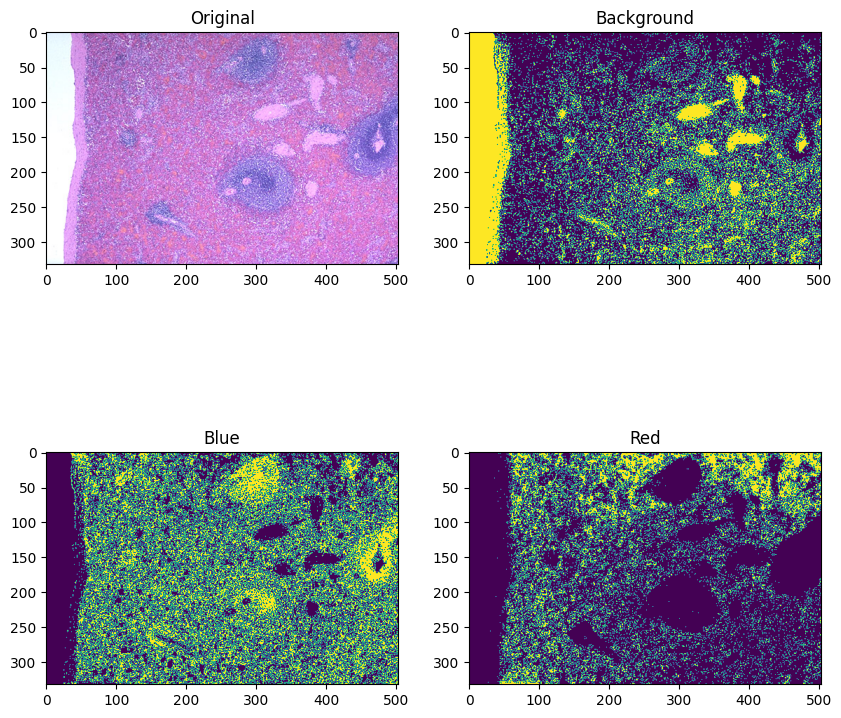

In [288]:
fname = '16708499122604.jpg'
# fname = os.path.join(basedir, 'test_images/10078.tiff')
img = read_image(fname)
print(img.shape)
img_rgb_show = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_rgb = img_rgb_show.astype(np.float64)
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float64)
N = img.shape[0]*img.shape[1]
Nbins = 51
thres_v = 230
thres_s = 10
thres_r = 150
thres_b = 200
img_rgb_filtered = img_rgb.reshape([-1, img_rgb.shape[-1]])
mask_bg = ~((img_hsv[:,:,1]>thres_s) & (img_hsv[:,:,2]<thres_v))
mask_blue = (~mask_bg) & ((img_rgb[:,:,0] < thres_r) | (img_rgb[:,:,2] > thres_b))
mask_red   = (~mask_bg) & (~mask_blue)

fig, ax = plt.subplots(2, 2, figsize=(10,10))
ax = [ax[0,0], ax[0,1], ax[1,0], ax[1,1]]
#     fig, ax = plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(img_rgb_show)
ax[0].set_title('Original')

#     ax[1].imshow(img_rgb_show)
#     ax[1].imshow(mask_bg, alpha=1, cmap='Greens')
ax[1].imshow(mask_bg)
ax[1].set_title('Background')

#     ax[2].imshow(img_rgb_show)
#     ax[2].imshow(mask_blue, alpha=1, cmap='Greens')
ax[2].imshow(mask_blue)
ax[2].set_title('Blue')

#     ax[3].imshow(img_rgb_show)
#     ax[3].imshow(mask_br, alpha=1, cmap='Greens')
ax[3].imshow(mask_red)
ax[3].set_title('Red')
plt.show()
#     break

10392
(3000, 3000, 3)


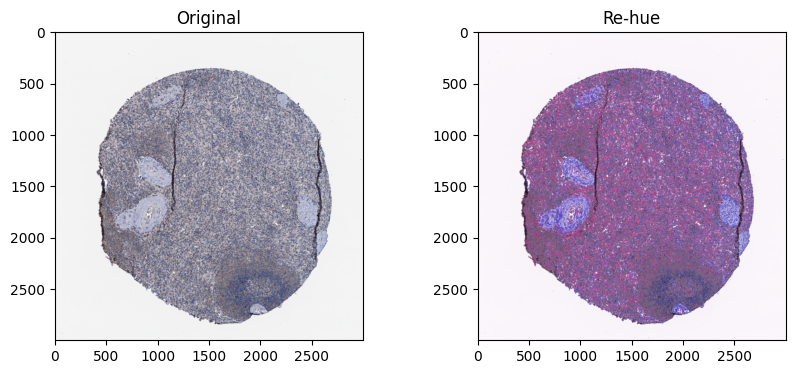

10610
(3000, 3000, 3)


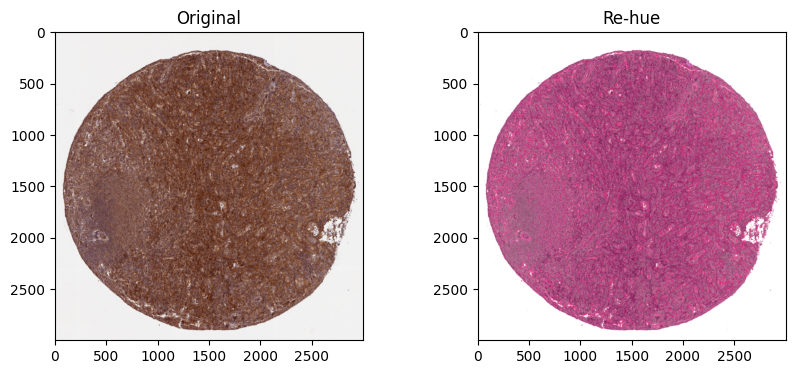

10703
(3000, 3000, 3)


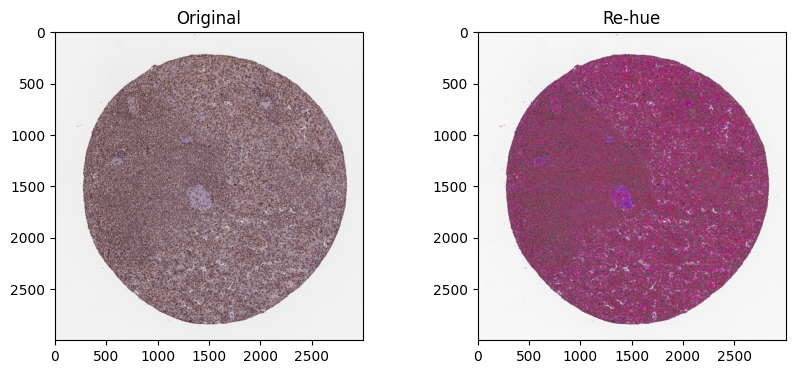

10992
(3000, 3000, 3)


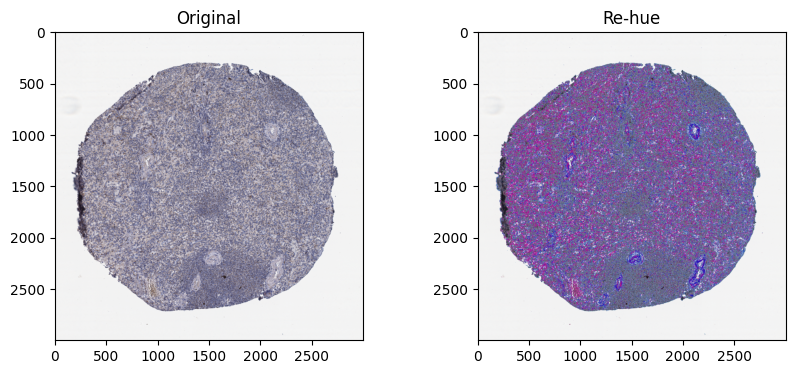

1123
(3000, 3000, 3)


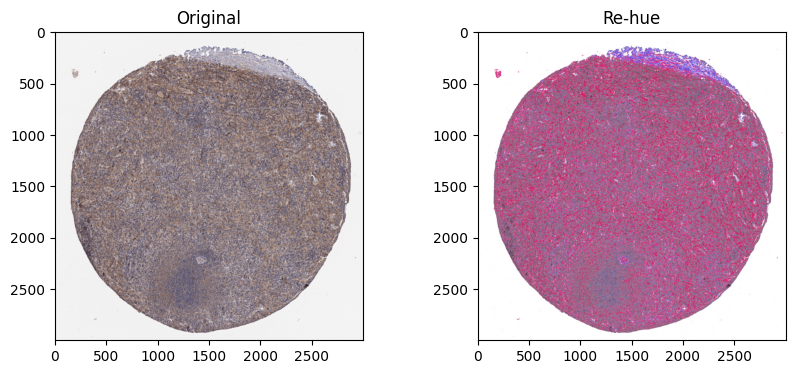

11448
(3000, 3000, 3)


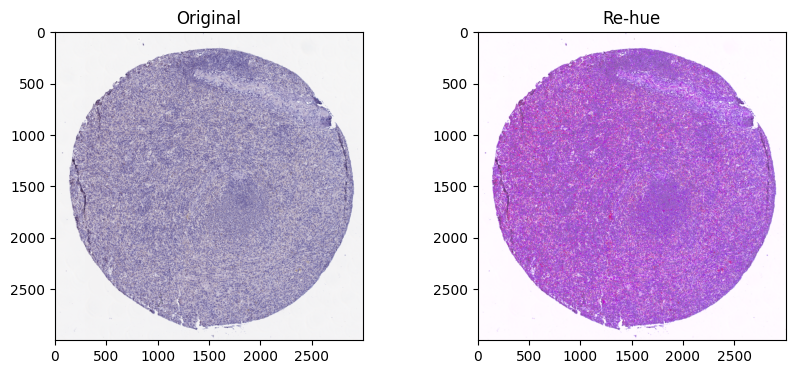

In [334]:
for i, (_id, row) in enumerate(df_train.loc['spleen'].iterrows()):
#     if i != 2:
#         continue
#     if _id != 12471:
#         continue
    if i > 5:
        break
    print(_id)
    img = read_image(os.path.join(row['path']))
    print(img.shape)
    img_rgb_show = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_rgb = img_rgb_show.astype(np.float64)
    img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV).astype(np.float64)
    N = img.shape[0]*img.shape[1]
    Nbins = 51
    thres_v = 230
    thres_s = 10
#     thres_bp = 180
#     thres_bm = 180
    thres_r = 150 # 150
    thres_b = 200
    
    dh_bl = np.random.rand()*20-10
    ds_bl = np.random.rand()*20
    dv_bl = np.random.rand()*20
    
    dh_br = np.random.rand()*20+140
    ds_br = np.random.rand()*128+100
    dv_br = np.random.rand()*50-10
    
    img_rgb_filtered = img_rgb.reshape([-1, img_rgb.shape[-1]])
    mask_bg = ~((img_hsv[:,:,1]>thres_s) & (img_hsv[:,:,2]<thres_v))
    mask_blue = (~mask_bg) & ((img_rgb[:,:,0] < thres_r) | (img_rgb[:,:,2] > thres_b))
    mask_br   = (~mask_bg) & (~mask_blue)
    
    mask_bg = np.expand_dims(mask_bg, axis=2)
    mask_bl = np.expand_dims(mask_blue, axis=2)
    mask_br = np.expand_dims(mask_br, axis=2)
    
    img_rgb_rehue_bg = img_rgb*mask_bg
    
    img_rgb_rehue_bl = img_hsv*mask_bl
#     img_rgb_rehue_bl[:,:,0] = (img_rgb_rehue_bl[:,:,0] + dh_bl) % 180
    img_rgb_rehue_bl[:,:,0] = np.where(
        img_rgb_rehue_bl[:,:,0] < 80,
        (img_rgb_rehue_bl[:,:,0] + dh_br) % 180,
        (img_rgb_rehue_bl[:,:,0] + dh_bl) % 180,
    )
    img_rgb_rehue_bl[:,:,1] = np.clip(img_rgb_rehue_bl[:,:,1] + ds_bl, 0, 255)
    img_rgb_rehue_bl[:,:,2] = np.clip(img_rgb_rehue_bl[:,:,2] + dv_bl, 0, 255)
    img_rgb_rehue_bl = cv2.cvtColor(img_rgb_rehue_bl.astype(np.uint8), cv2.COLOR_HSV2RGB).astype(np.float64)
    
    img_rgb_rehue_br = img_hsv*mask_br
#     img_rgb_rehue_br[:,:,0] = (img_rgb_rehue_br[:,:,0] + dh_br) % 180
    img_rgb_rehue_br[:,:,0] = np.where(
        img_rgb_rehue_br[:,:,0] < 80,
        (img_rgb_rehue_br[:,:,0] + dh_br) % 180,
        (img_rgb_rehue_br[:,:,0] + dh_bl) % 180,
    )
    img_rgb_rehue_br[:,:,1] = np.clip(img_rgb_rehue_br[:,:,1] + ds_br, 0, 255)
    img_rgb_rehue_br[:,:,2] = np.clip(img_rgb_rehue_br[:,:,2] + dv_br, 0, 255)
    img_rgb_rehue_br = cv2.cvtColor(img_rgb_rehue_br.astype(np.uint8), cv2.COLOR_HSV2RGB).astype(np.float64)
    
    img_rgb_rehue = img_rgb_rehue_bg + img_rgb_rehue_bl + img_rgb_rehue_br
    img_rgb_rehue = np.clip(img_rgb_rehue, 0, 255)
    
    img_rgb_rehue = img_rgb_rehue.astype(np.uint8)
    
    fig, ax = plt.subplots(1, 2, figsize=(10,4))
    ax[0].imshow(img_rgb_show)
    ax[0].set_title('Original')
    
    ax[1].imshow(img_rgb_rehue)
    ax[1].set_title('Re-hue')
    plt.show()
#     break

In [217]:
np.random.rand()

0.4376277318180549

In [ ]:
# (H_blue - H)*(H_pink - H_blue)/(H_blue - H_brown) + H_blue